In [1]:
from collections import Counter
import gzip
import pathlib

import torch
import pandas as pd
import scipy
import numpy as np

import scanpy as sc
import anndata as ad
import gseapy

import seaborn as sns
import matplotlib.pyplot as plt

import flipcrow
import flipcrow.paths
import flipcrow.scp1644_mothership as mship

mps_device = torch.device("mps")

# sc.settings.verbosity = 0
import warnings
warnings.filterwarnings("ignore")

sc.set_figure_params(figsize=(10, 10))

%matplotlib inline

1.10.0rc2


In [2]:
scp1644_raw = mship.load_scp1644_data(check_metadata=True)

25.540019989013672
Checking metadata!
Biosample IDs
Counter({'PANFR0489R_Biopsy_None': 2344, 'PANFR0592_Biopsy_None': 2103, 'PANFR0557_Biopsy_None': 1863, 'PANFR0473_Biopsy_None': 1370, 'PANFR0545_Biopsy_None': 1318, 'PANFR0604_Biopsy_None': 1277, 'PANFR0580_Biopsy_None': 1243, 'PANFR0593_Biopsy_None': 1170, 'PANFR0562_Biopsy_None': 1140, 'PANFR0552_Biopsy_None': 1112, 'PANFR0576_Biopsy_None': 1011, 'PANFR0383_Biopsy_None': 1008, 'PANFR0635_Biopsy_None': 964, 'PANFR0575_Biopsy_None': 867, 'PANFR0637_Biopsy_None': 862, 'PANFR0605_Biopsy_None': 848, 'PANFR0598_Biopsy_None': 792, 'PANFR0631_Biopsy_None': 789, 'PANFR0578_Biopsy_None': 659, 'PANFR0543_Biopsy_None': 620, 'PANFR0583_Biopsy_None': 492, 'PANFR0526_Biopsy_None': 262, 'PANFR0489_Biopsy_None': 213, 'PANFR0588_Biopsy_None': 85})
Cell tags
Counter({'Biopsy_PANFR0489': 2557, 'Biopsy_PANFR0592': 2103, 'Biopsy_PANFR0557': 1863, 'Biopsy_PANFR0473': 1370, 'Biopsy_PANFR0545': 1318, 'Biopsy_PANFR0604': 1277, 'Biopsy_PANFR0580': 1243, 'Biop

In [2]:
# scp1644_raw.write_h5ad(flipcrow.paths.DATA_PATH / "SCP1644" / "mship_scp1644_raw.h5ad")
scp1644_raw = ad.read_h5ad(flipcrow.paths.DATA_PATH / "SCP1644" / "mship_scp1644_raw.h5ad")

In [160]:
scp1644_trim = mship.pp_scp1644_data(scp1644_raw)

Per chunk QC
Concatenate
PANFR0473_Biopsy_None : (1362, 16814)
PANFR0557_Biopsy_None : (1857, 16814)
PANFR0637_Biopsy_None : (860, 16814)
PANFR0631_Biopsy_None : (787, 16814)
PANFR0605_Biopsy_None : (847, 16814)
PANFR0593_Biopsy_None : (1170, 16814)
PANFR0543_Biopsy_None : (609, 16814)
PANFR0576_Biopsy_None : (1011, 16814)
PANFR0552_Biopsy_None : (1105, 16814)
PANFR0578_Biopsy_None : (659, 16814)
PANFR0545_Biopsy_None : (1318, 16814)
PANFR0526_Biopsy_None : (254, 16814)
PANFR0562_Biopsy_None : (1138, 16814)
PANFR0489_Biopsy_None : (205, 16814)
PANFR0575_Biopsy_None : (866, 16814)
PANFR0598_Biopsy_None : (792, 16814)
PANFR0489R_Biopsy_None : (2340, 16814)
PANFR0583_Biopsy_None : (492, 16814)
PANFR0592_Biopsy_None : (2101, 16814)
PANFR0580_Biopsy_None : (1242, 16814)
PANFR0383_Biopsy_None : (987, 16814)
PANFR0635_Biopsy_None : (964, 16814)
PANFR0604_Biopsy_None : (1277, 16814)
PANFR0588_Biopsy_None : (81, 16814)

Merged QC
Scrublet
Dimensionality reduction and clustering
HVG + Rank genes

In [3]:
# scp1644_trim.write_h5ad(flipcrow.paths.DATA_PATH / "SCP1644" / "mship_scp1644_trim.h5ad")
scp1644_trim = ad.read_h5ad(flipcrow.paths.DATA_PATH / "SCP1644" / "mship_scp1644_trim.h5ad")

In [4]:
print(scp1644_trim)
print(len(scp1644_trim.obs.leiden.unique()))

AnnData object with n_obs × n_vars = 24323 × 16604
    obs: 'biosample_id', 'donor_ID', 'Genes', 'UMI', 'dataset', 'sample.type', 'species', 'species__ontology_label', 'disease', 'disease__ontology_label', 'organ', 'organ__ontology_label', 'library_preparation_protocol', 'library_preparation_protocol__ontology_label', 'sex', 'Coarse_Cell_Annotations', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'u400genes', 'u1000counts', 'o50mtpct', 'o8000genes', 'doublet_score', 'predicted_doublet', 'leiden'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'low_qual_u50cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'scrublet', 'tsne', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    layers: 'trimmed

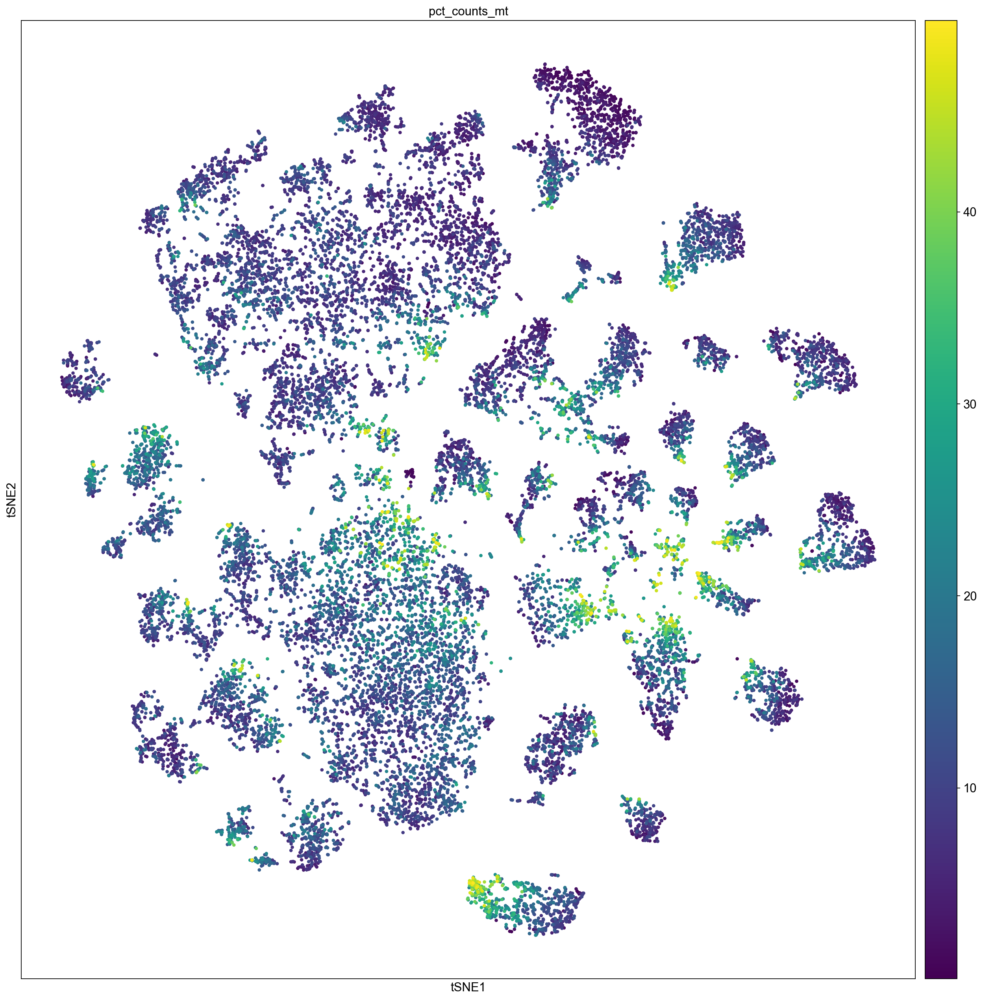

In [167]:
sc.pl.tsne(scp1644_filter, color=['pct_counts_mt'], size=60)

Initial tSNE


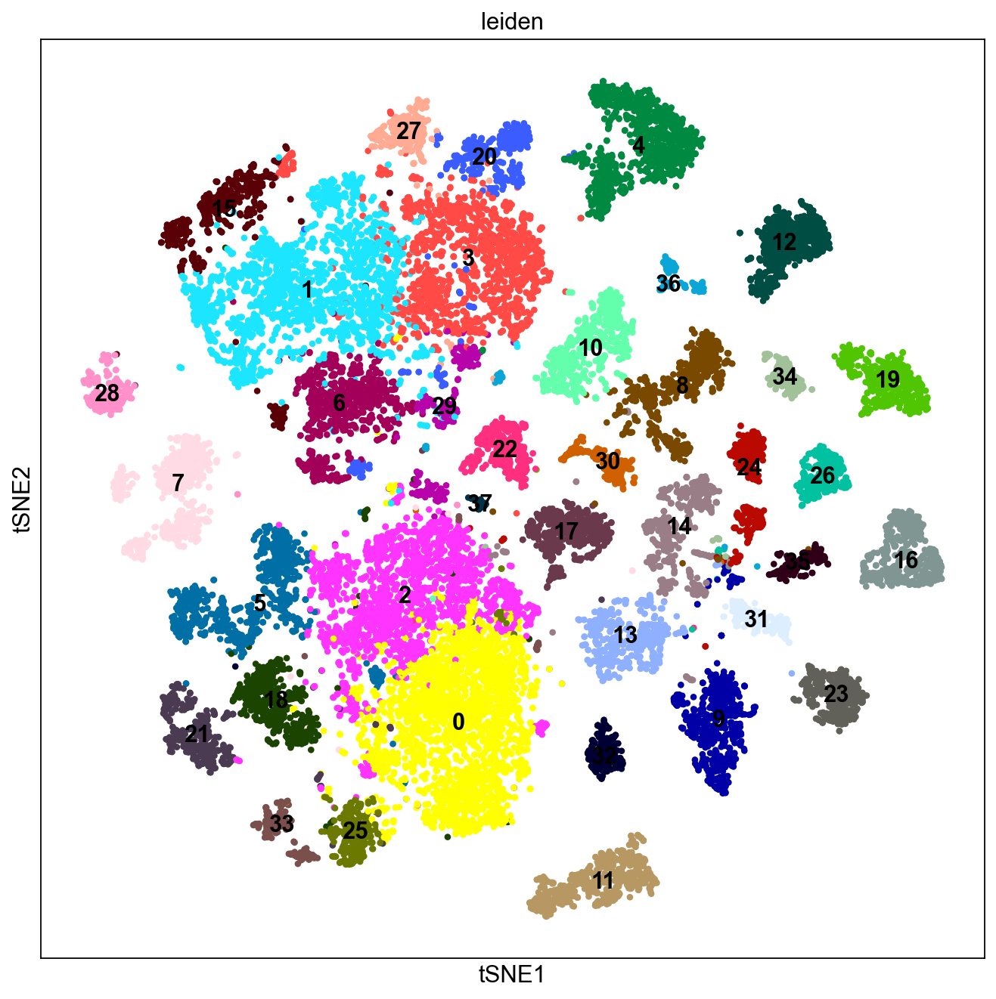

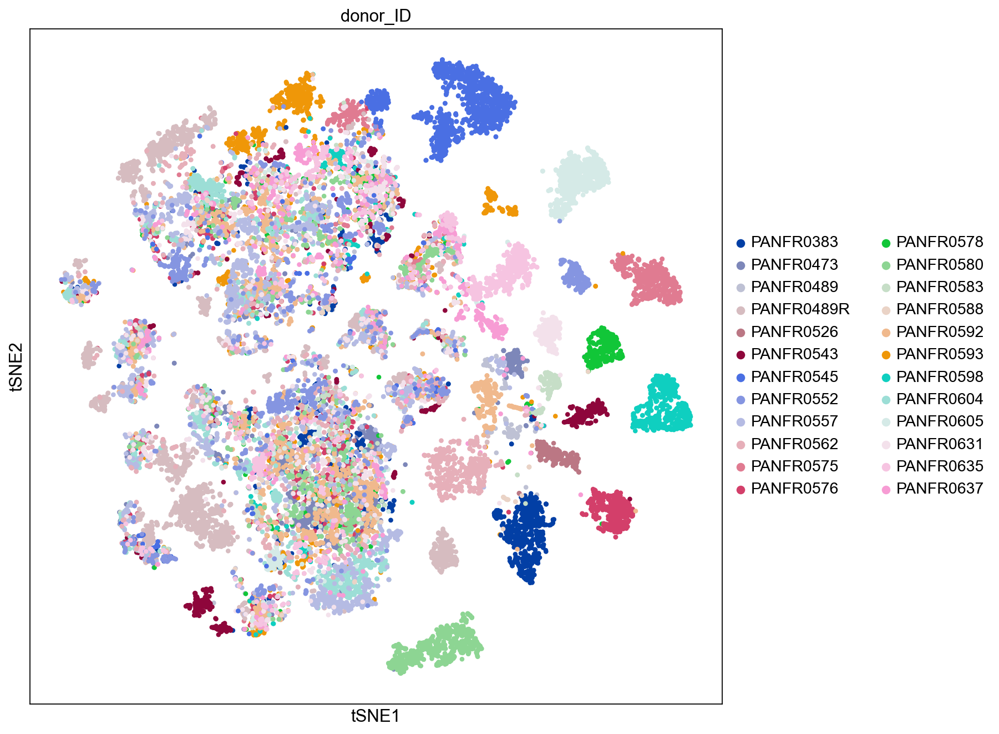

Calculating cluster stats


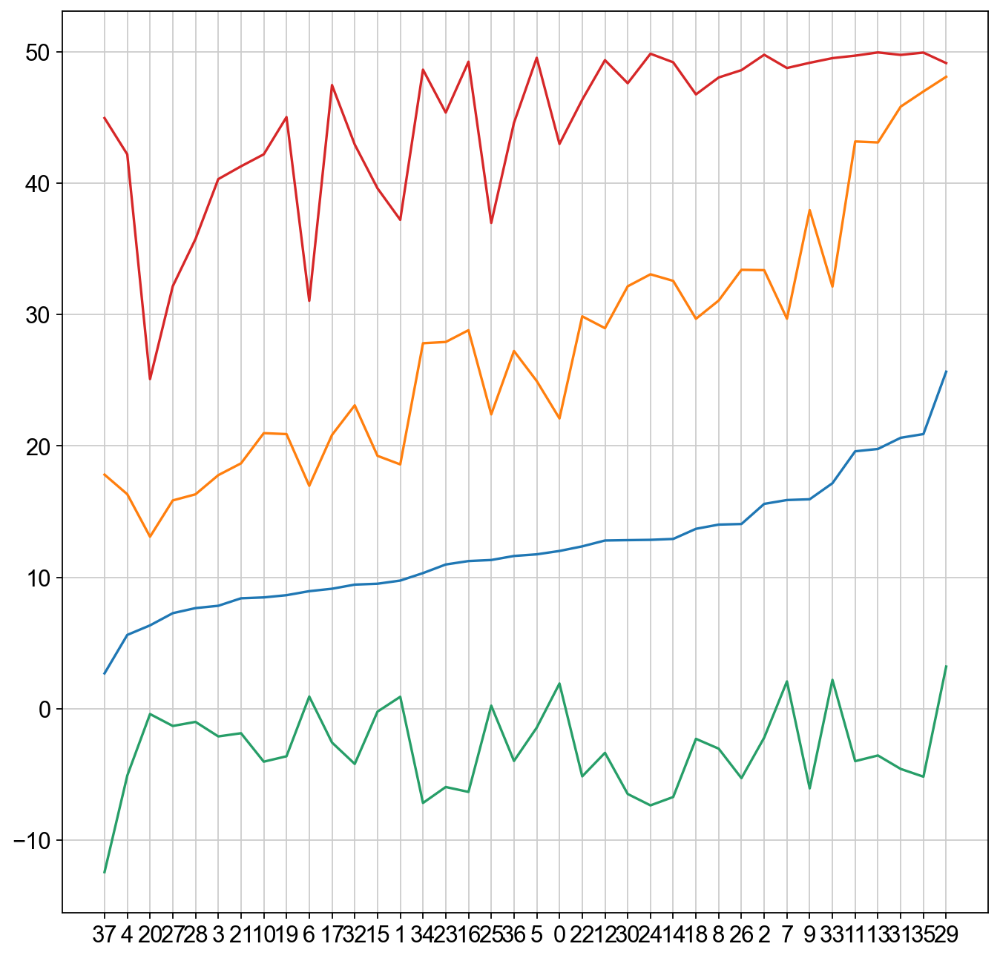

Running mitoscreen
33    0.547619
29    0.476190
35    0.404762
31    0.238095
13    0.142857
7     0.142857
8     0.071429
11    0.047619
26    0.047619
36    0.047619
34    0.047619
18    0.047619
37    0.023810
12    0.023810
9     0.023810
2     0.023810
24    0.023810
23    0.000000
30    0.000000
32    0.000000
28    0.000000
27    0.000000
25    0.000000
0     0.000000
22    0.000000
21    0.000000
20    0.000000
1     0.000000
17    0.000000
16    0.000000
15    0.000000
14    0.000000
10    0.000000
6     0.000000
5     0.000000
4     0.000000
3     0.000000
19    0.000000
Name: GGB_MITOCHONDRIAL, dtype: float64


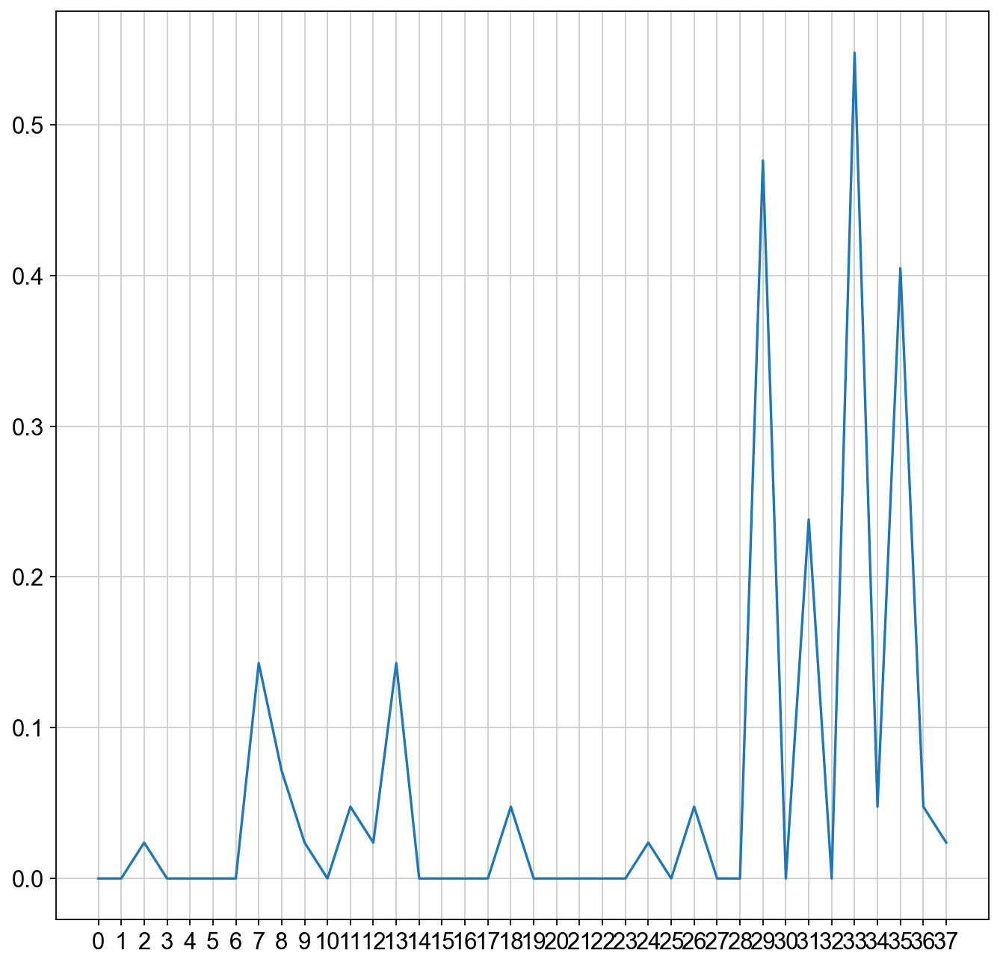

Preprocessing filtered dataset
Final tSNE


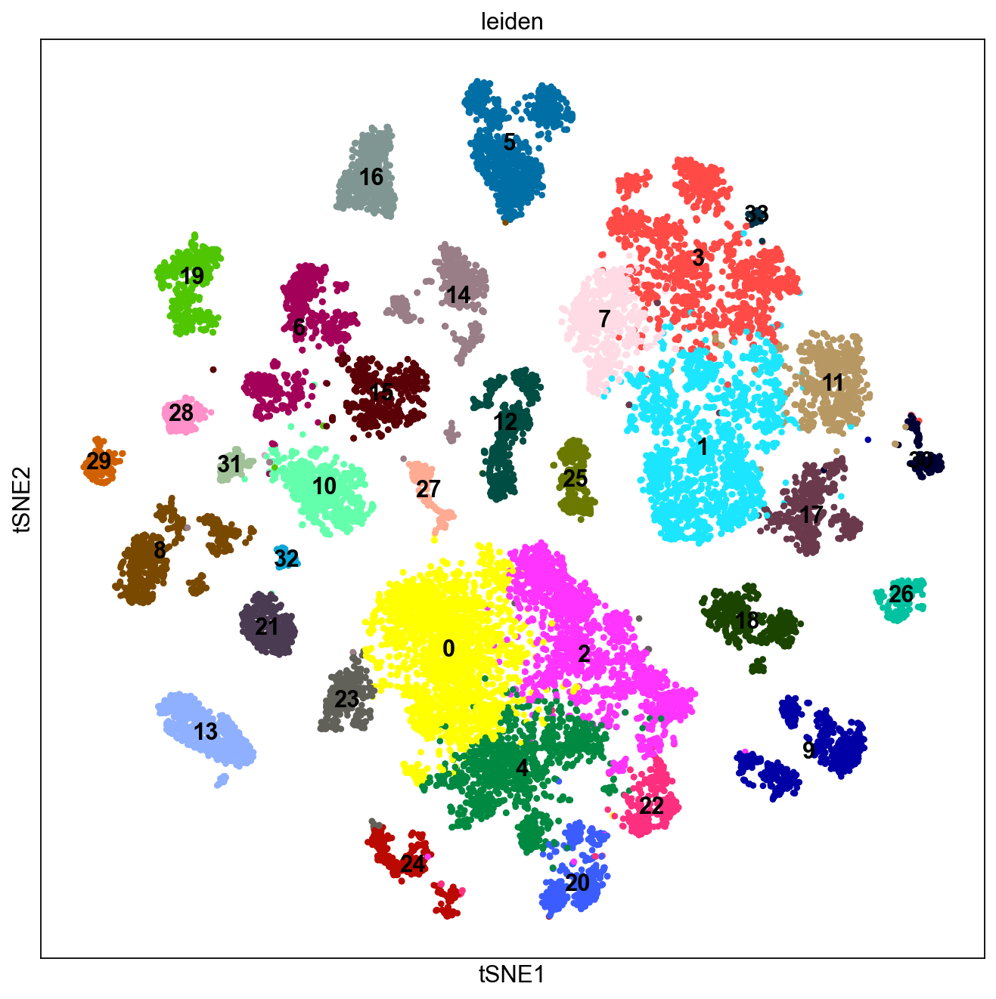

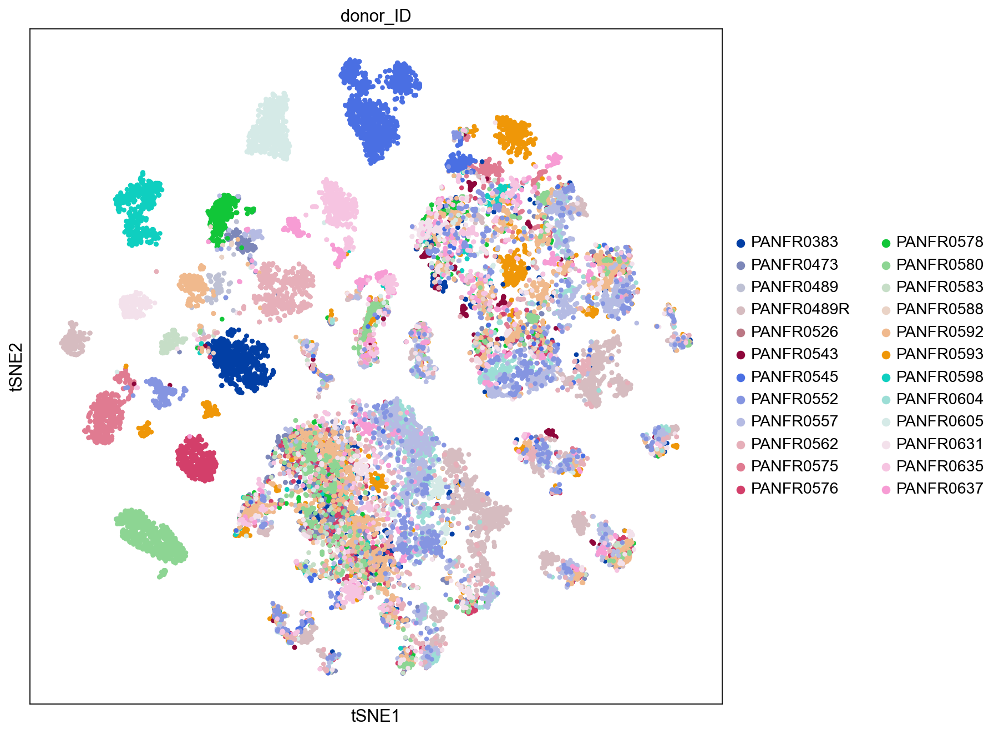

In [5]:
scp1644_filter = mship.mito_doublet_screen(scp1644_trim, mt_cutoff=0.15, doublet_cutoff=0.1)

In [6]:
print(scp1644_filter)

AnnData object with n_obs × n_vars = 22172 × 16604
    obs: 'biosample_id', 'donor_ID', 'Genes', 'UMI', 'dataset', 'sample.type', 'species', 'species__ontology_label', 'disease', 'disease__ontology_label', 'organ', 'organ__ontology_label', 'library_preparation_protocol', 'library_preparation_protocol__ontology_label', 'sex', 'Coarse_Cell_Annotations', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'u400genes', 'u1000counts', 'o50mtpct', 'o8000genes', 'doublet_score', 'predicted_doublet', 'leiden', 'GGB_MITOCHONDRIAL'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'low_qual_u50cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'scrublet', 'tsne', 'umap', 'leiden_colors', 'donor_ID_colors'
    obsm: 'X_pca'

In [71]:
scp1644_filter.write_h5ad(flipcrow.paths.DATA_PATH / "SCP1644" / "mship_scp1644_filter_new.h5ad")
scp1644_filter_old = ad.read_h5ad(flipcrow.paths.DATA_PATH / "SCP1644" / "mship_scp1644_filter.h5ad")

In [72]:
print(scp1644_filter)
print(scp1644_filter_old)

AnnData object with n_obs × n_vars = 22172 × 16604
    obs: 'biosample_id', 'donor_ID', 'Genes', 'UMI', 'dataset', 'sample.type', 'species', 'species__ontology_label', 'disease', 'disease__ontology_label', 'organ', 'organ__ontology_label', 'library_preparation_protocol', 'library_preparation_protocol__ontology_label', 'sex', 'Coarse_Cell_Annotations', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'u400genes', 'u1000counts', 'o50mtpct', 'o8000genes', 'doublet_score', 'predicted_doublet', 'leiden', 'GGB_MITOCHONDRIAL'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'low_qual_u50cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'scrublet', 'tsne', 'umap', 'leiden_colors', 'donor_ID_colors', 'Coarse_Cell_Ann

In [9]:
# print('\n'.join(map(str, list(pathlib.Path('/Users/daniel/Downloads/').glob('*.xlsx')))))
# print()
# print('\n'.join(map(str, list((flipcrow.paths.DATA_PATH / "markergenes").glob('*.xlsx')))))

normal_markers = pd.read_excel(flipcrow.paths.DATA_PATH / "markergenes" / "mmc2.xlsx", header=4, dtype=object)
normal_markers = normal_markers.iloc[:, 2:]
normal_markers = normal_markers.loc[:, ['Gene', 'myAUC', 'avg_diff', 'power', 'avg_logFC', 'pct.1', 'pct.2', 'cell.type']]
normal_markers_dict = {}

In [63]:
# filter datetime oddities found in original data probably caused by entering MARCH1, MARCH11 etc in dataset. This is (possibly?) auto converted to 11-Mar, 1-Mar, etc 

for grpid, grp in normal_markers.groupby('cell.type'):
    normal_markers_dict[grpid] = [grp.loc[idx, 'Gene'] for idx in grp.index if type(grp.loc[idx, 'Gene']) == str and float(grp.loc[idx, 'power']) >= 0.6]


In [64]:
#print(normal_markers_dict)
markers_dict = normal_markers_dict.copy()

# add tumor keratins
markers_dict['Tumor_keratins'] = [
    'KRT5',
    'KRT7',
    'KRT8', 
    'KRT10',
    'KRT13',
    'KRT14',
    'KRT17',
    'KRT18',
    'KRT19',
]

# markers_dict['PDAC_quartet'] = [
#     'KRAS',
#     'TP53',
#     'SMAD4',
#     'CDKN2A',
# ]

moffitt_pdac = {
    'BASAL': [
        'VGLL1', 
        'UCA1', 
        'S100A2', 
        'LY6D', 
        'SPRR3',
        'SPRR1B',
        'LEMD1',
        'KRT15',
        'CTSV', # 'CTSL2',
        'DHRS9',
        'AREG',
        'CST6',
        'SERPINB3',
        # 'KRT6C', # not present in var_names
        'KRT6A',
        'FAM83A',
        'SCEL',
        'FGFBP1',
        'KRT7',
        'KRT17',
        'GPR87',
        'TNS4',
        'SLC2A1',
        'ANXA8L2',
    ],
    'CLASSICAL': [
        'BTNL8',
        'FAM3D',
        'PRR15L', # 'ATAD4',
        'AGR3',
        'CTSE',
        # 'TMEM238L', # 'LOC400573', not present in genes
        # 'LYZ', # common in T cells
        'TFF2',
        'TFF1',
        'ANXA10',
        'LGALS4',
        'PLA2G10',
        'CEACAM6',
        'VSIG2',
        'TSPAN8',
        'ST6GALNAC1',
        'AGR2',
        'TFF3',
        'CYP3A7',
        'MYO1A',
        'CLRN3',
        'KRT20',
        'CDH17',
        'SPINK4',
        'REG4',
    ],
}

markers_dict.update(moffitt_pdac)

In [65]:
cancer_only = {k:v for k, v in markers_dict.items() if k in ['Tumor_keratins', 'BASAL', 'CLASSICAL']}

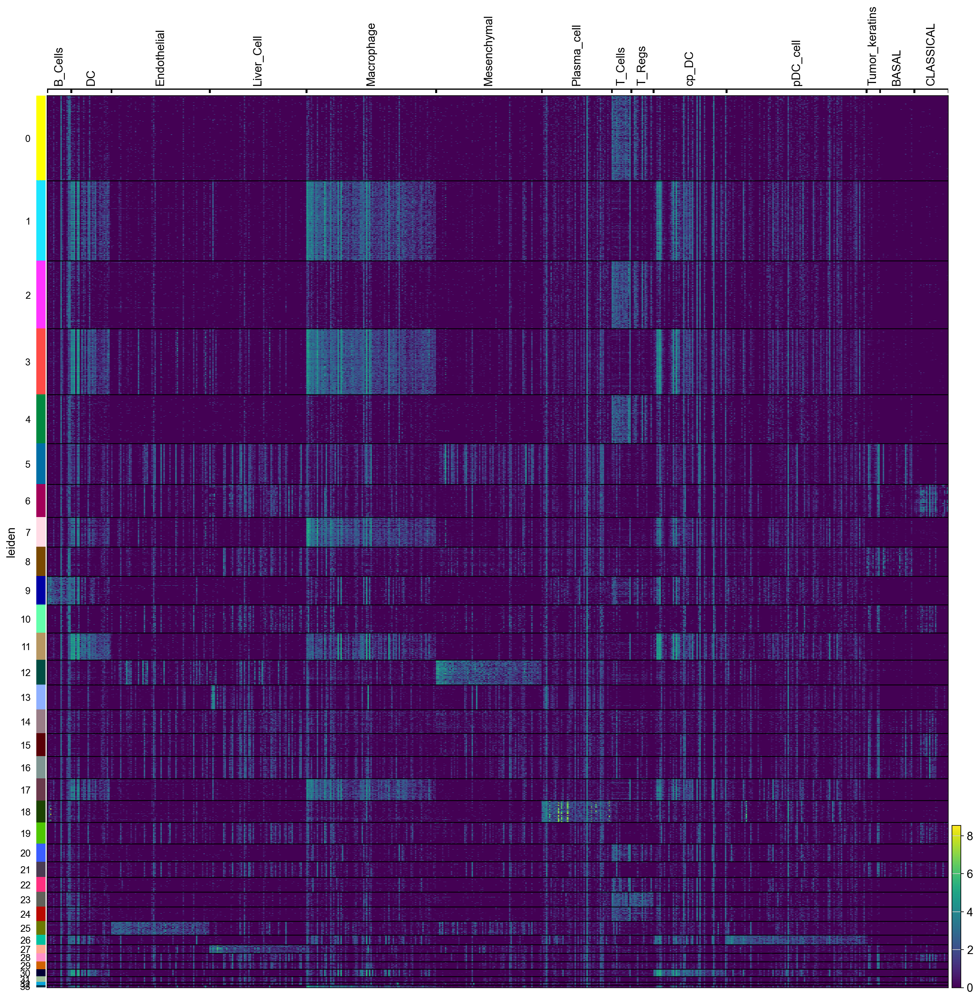

In [66]:
# sc.set_figure_params()

# sc.pl.heatmap(scp1644_relax, markers_dict, 'leiden', figsize=(20, 20))
sc.pl.heatmap(scp1644_filter, markers_dict, 'leiden', figsize=(20, 20))

In [67]:
verdict = sc.tl.marker_gene_overlap(scp1644_filter, markers_dict, method='overlap_coef').T


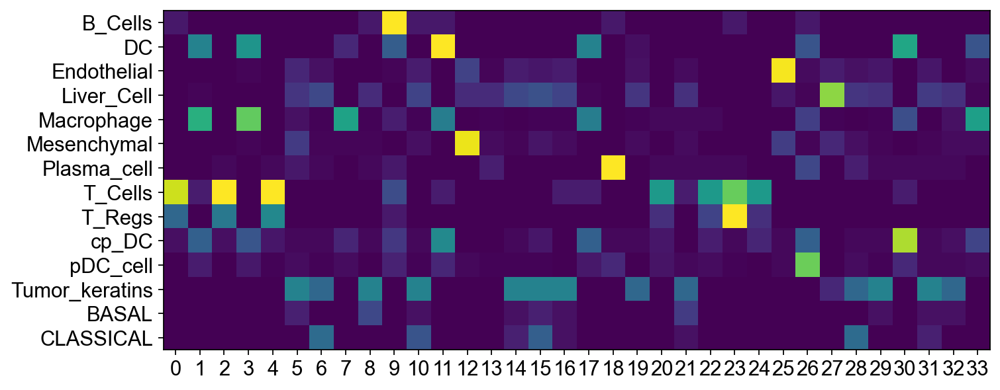

In [68]:
fig, ax = plt.subplots()
im = ax.imshow(verdict.T)
ax.set_xticks(np.arange(len(verdict.index)))
ax.set_yticks(np.arange(len(verdict.columns)), labels=verdict.columns)
ax.grid(None)
plt.show()
# ax.set_yticks(np.arange(len(vegetables)), labels=vegetables)

In [69]:
for leiden_idx in sorted(scp1644_filter.obs.leiden.unique().astype(int)):
    print(leiden_idx, Counter(scp1644_filter.obs.loc[scp1644_filter.obs.leiden == str(leiden_idx), 'Coarse_Cell_Annotations']))

0 Counter({'T_NK': 2070, 'T_Regs': 14, 'Endothelial': 9, 'Hepatocyte': 7, 'Mesenchymal': 5, 'Macrophage': 3, 'Tumor': 3, 'B_Cells': 2, 'DC': 1})
1 Counter({'Macrophage': 1903, 'DC': 80, 'Endothelial': 9, 'Plasma_cell': 1, 'XCR1_DC': 1, 'T_NK': 1})
2 Counter({'T_NK': 1609, 'T_Regs': 35, 'Endothelial': 24, 'Hepatocyte': 12, 'B_Cells': 2, 'Plasma_cell': 1})
3 Counter({'Macrophage': 1637, 'DC': 2, 'T_NK': 1})
4 Counter({'T_NK': 1202, 'T_Regs': 7, 'Hepatocyte': 2, 'Plasma_cell': 1, 'Mesenchymal': 1})
5 Counter({'Tumor': 1016, 'Hepatocyte': 1})
6 Counter({'Tumor': 815, 'Hepatocyte': 3})
7 Counter({'Macrophage': 732, 'Mesenchymal': 3, 'Hepatocyte': 1, 'Endothelial': 1})
8 Counter({'Tumor': 729, 'T_NK': 3})
9 Counter({'B_Cells': 698, 'T_NK': 4, 'Plasma_cell': 2, 'Endothelial': 1})
10 Counter({'Tumor': 705})
11 Counter({'DC': 567, 'Macrophage': 78, 'XCR1_DC': 16, 'B_Cells': 5, 'Endothelial': 2})
12 Counter({'Mesenchymal': 622})
13 Counter({'Tumor': 613})
14 Counter({'Tumor': 459, 'Mesenchymal':

In [126]:
print(np.argmax(verdict.T, axis=0))
call_dict = verdict.T.index[np.argmax(verdict.T, axis=0)]
# print(np.argmax(verdict.T, axis=1))

replace_dict = {
    'T_Cells': 'T_NK',
    'Macrophage': 'Macrophage',
    'Tumor_keratins': 'Tumor',
    'Basal': 'Tumor',
    'Classical': 'Tumor',
    'B_Cells': 'B_Cells',
    'DC': 'DC',
    'Mesenchymal': 'Mesenchymal',
    'Liver_Cell': 'Hepatocyte',
    'Plasma_cell': 'Plasma_cell',
    'T_Regs': 'T_Regs',
    'Endothelial': 'Endothelial',
    'pDC_cell': 'pDC_cell',
    'cp_DC': 'XCR1_DC',
}

# for item in call_dict
# print(call_dict)

# local_coarse_call = [call_dict[x]for x in ]


verdict_strings = list(verdict.T.index[np.argmax(verdict.T, axis=0)])
# verdict_dict = {x: verdict_strings[x] for x in 

print(len(verdict_strings))

verdict_buf = []
for leid_idx in scp1644_filter.obs.leiden:
    verdict_buf.append(replace_dict[verdict_strings[int(leid_idx)]])

scp1644_filter.obs.loc[:, 'local_coarse_call'] = verdict_buf
    
#     'Tumor_keratins': 'Tumor',
#     'T_Cells': 'T_NK',
# }))

[ 7  4  7  4  7 11 13  4 11  0 11  1  5  3 11 11 11  1  6 11  7 11  7  8
  7  2 10  3 13 11  9 11 11  4]
34


In [125]:
print(sum(scp1644_filter.obs.Coarse_Cell_Annotations == scp1644_filter.obs.local_coarse_call))
print(sum(scp1644_filter.obs.Coarse_Cell_Annotations == scp1644_filter.obs.local_coarse_call) / scp1644_filter.shape[0])
print(scp1644_filter.obs.loc[:, ['Coarse_Cell_Annotations', 'local_coarse_call']])


20471
0.9232816164531842
                                 Coarse_Cell_Annotations local_coarse_call
Biopsy_PANFR0489_T1_AAACAAATCCGA              Hepatocyte             Tumor
Biopsy_PANFR0489_T1_AACCGAGAGTCC                   Tumor             Tumor
Biopsy_PANFR0489_T1_AACCGTACCATG                   Tumor             Tumor
Biopsy_PANFR0489_T1_AAGCGAGAGCTG                   Tumor             Tumor
Biopsy_PANFR0489_T1_AAGGGTAGCCCT                   Tumor             Tumor
...                                                  ...               ...
Biopsy_PANFR0635_T1_TTTATAAGGATC                   Tumor             Tumor
Biopsy_PANFR0635_T1_TTTCATCTCTCG             Mesenchymal             Tumor
Biopsy_PANFR0635_T1_TTTCCGTAGCTA                    T_NK              T_NK
Biopsy_PANFR0635_T1_TTTGACTAGATT             Mesenchymal       Mesenchymal
Biopsy_PANFR0635_T1_TTTGGGATCTAC                   Tumor             Tumor

[22172 rows x 2 columns]


Counter({'Tumor': 6988, 'T_NK': 6130, 'Macrophage': 4910, 'Mesenchymal': 758, 'B_Cells': 709, 'DC': 697, 'Plasma_cell': 550, 'T_Regs': 404, 'Endothelial': 393, 'Hepatocyte': 249, 'pDC_cell': 242, 'XCR1_DC': 142})


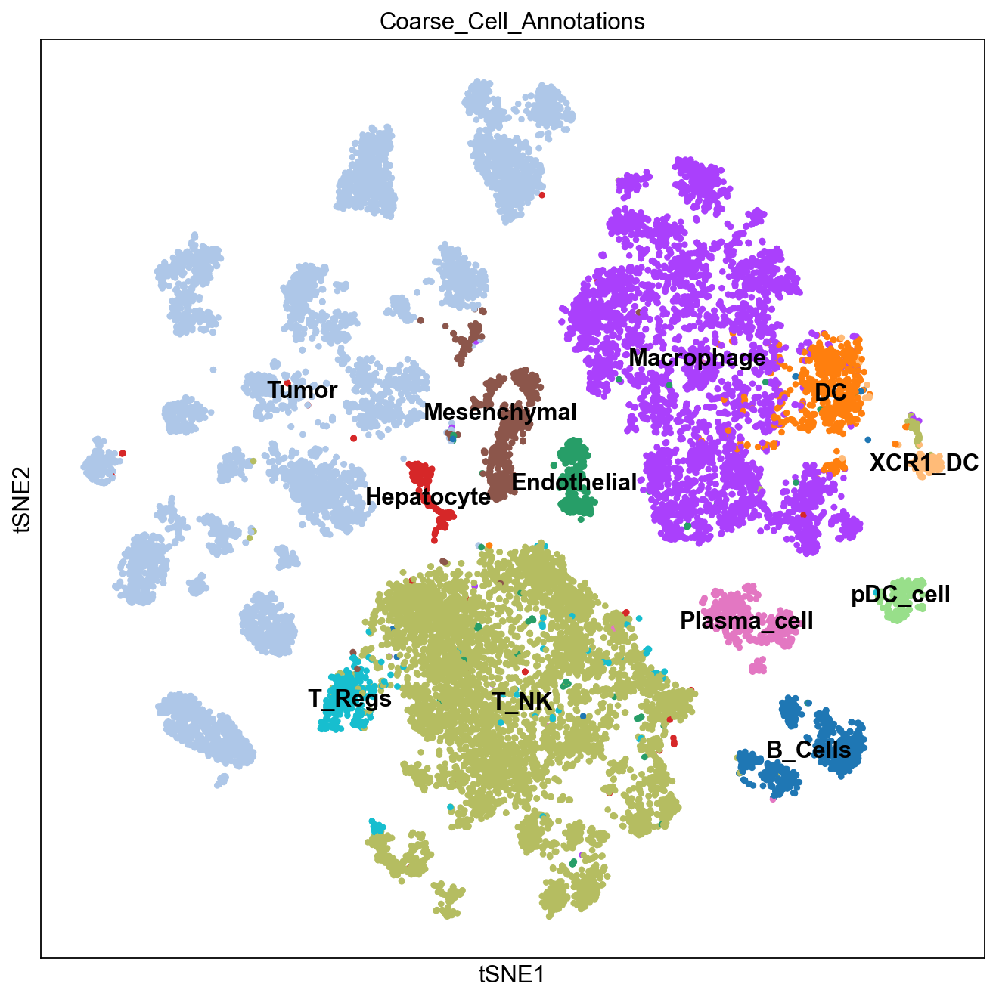

In [70]:
print(Counter(scp1644_filter.obs['Coarse_Cell_Annotations']))
sc.pl.tsne(scp1644_filter, color='Coarse_Cell_Annotations', legend_loc="on data", size=60)

In [20]:
scp1644_tumor = scp1644_filter[scp1644_filter.obs['Coarse_Cell_Annotations'] == 'Tumor']

In [22]:
print(scp1644_tumor)
sc.pp.pca(scp1644_tumor)
sc.pp.neighbors(scp1644_tumor, n_neighbors=40, n_pcs=50)
sc.tl.leiden(scp1644_tumor, resolution=)
sc.tl.umap(scp1644_tumor)
sc.tl.tsne(scp1644_tumor)
sc.pp.highly_variable_genes(scp1644_tumor, flavor="seurat")
sc.tl.rank_genes_groups(scp1644_tumor, 'leiden')

View of AnnData object with n_obs × n_vars = 6988 × 16604
    obs: 'biosample_id', 'donor_ID', 'Genes', 'UMI', 'dataset', 'sample.type', 'species', 'species__ontology_label', 'disease', 'disease__ontology_label', 'organ', 'organ__ontology_label', 'library_preparation_protocol', 'library_preparation_protocol__ontology_label', 'sex', 'Coarse_Cell_Annotations', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'u400genes', 'u1000counts', 'o50mtpct', 'o8000genes', 'doublet_score', 'predicted_doublet', 'leiden', 'GGB_MITOCHONDRIAL'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'low_qual_u50cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'scrublet', 'tsne', 'umap', 'leiden_colors', 'donor_ID_colors', 'Coarse_C

In [27]:
sc.tl.leiden(scp1644_tumor, resolution=1.2)
sc.pp.highly_variable_genes(scp1644_tumor, flavor="seurat")
sc.tl.rank_genes_groups(scp1644_tumor, 'leiden')

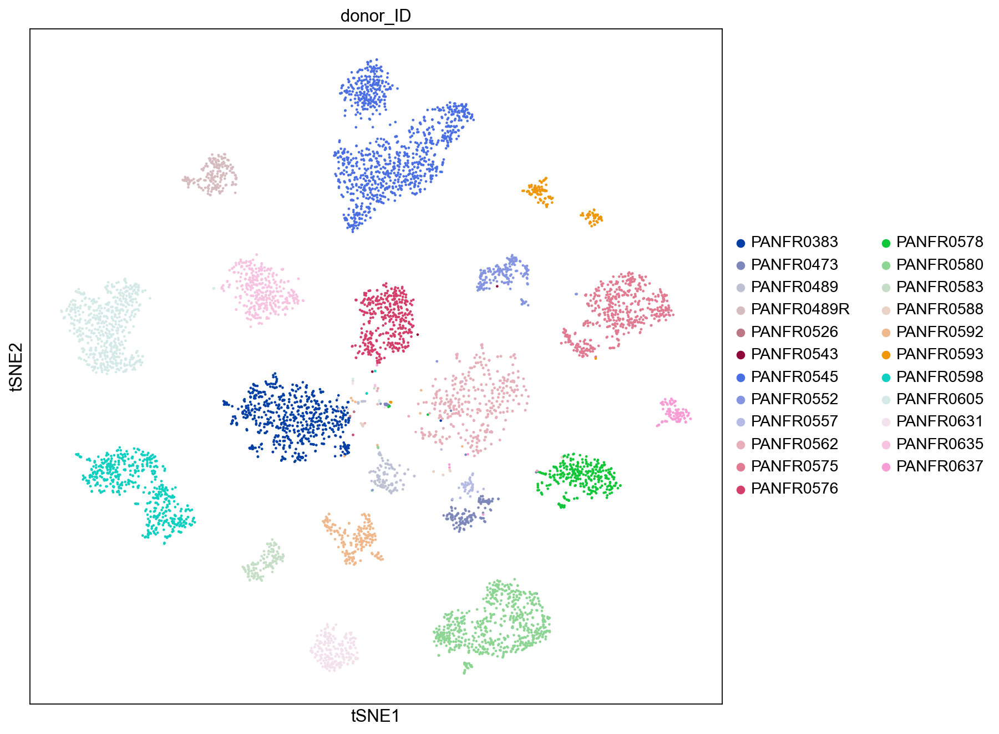

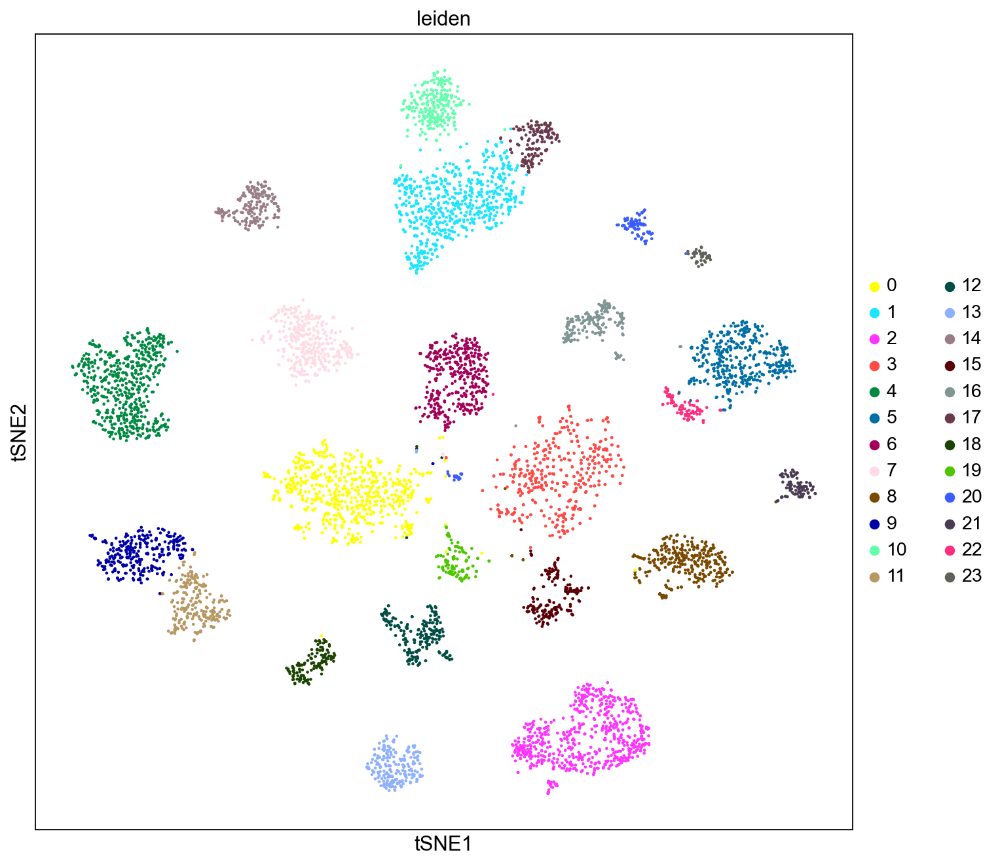

In [28]:
sc.pl.tsne(scp1644_tumor, color='donor_ID')
sc.pl.tsne(scp1644_tumor, color='leiden')

In [29]:
sc.tl.score_genes(scp1644_tumor, moffitt_pdac['CLASSICAL'], score_name='classical_score', ctrl_size=100)
sc.tl.score_genes(scp1644_tumor, moffitt_pdac['BASAL'], score_name='basal_score', ctrl_size=100)
scp1644_tumor.obs.loc[:, 'diff_score'] = scp1644_tumor.obs.classical_score - scp1644_tumor.obs.basal_score

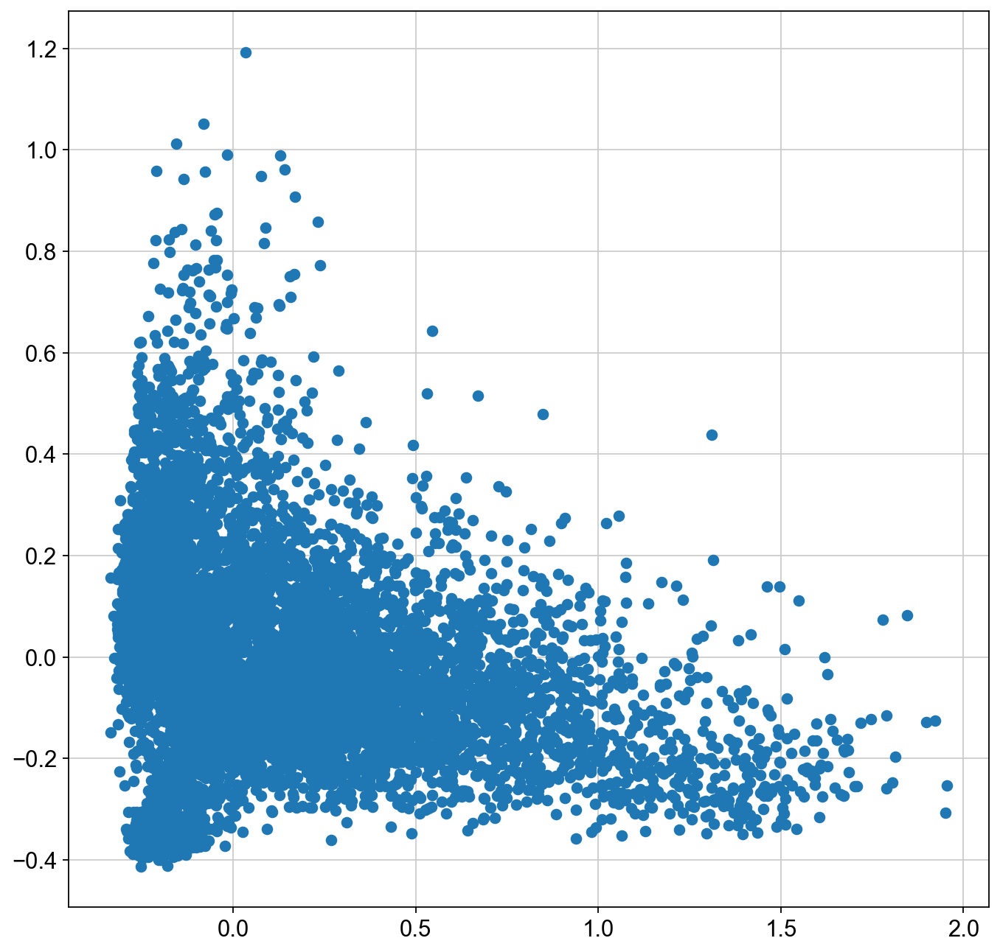

In [30]:
plt.plot(scp1644_tumor.obs.classical_score, scp1644_tumor.obs.basal_score, 'o')

CTSE (Classical)
Pearson Classical PearsonRResult(statistic=0.7732180810457454, pvalue=0.0)
Pearson Basal PearsonRResult(statistic=-0.2803045148456233, pvalue=2.496969564044072e-126)
Spearman Classical SignificanceResult(statistic=0.759833177518912, pvalue=0.0)
Spearman Basal SignificanceResult(statistic=-0.26878616895200175, pvalue=6.201484111622728e-116)

KRT7 (Basal)
Pearson Classical PearsonRResult(statistic=-0.17117129954529303, pvalue=4.2949308362065206e-47)
Pearson Basal PearsonRResult(statistic=0.5815628914863588, pvalue=0.0)
Spearman Classical SignificanceResult(statistic=-0.1861241854331009, pvalue=1.6770259913423326e-55)
Spearman Basal SignificanceResult(statistic=0.6469260724471683, pvalue=0.0)


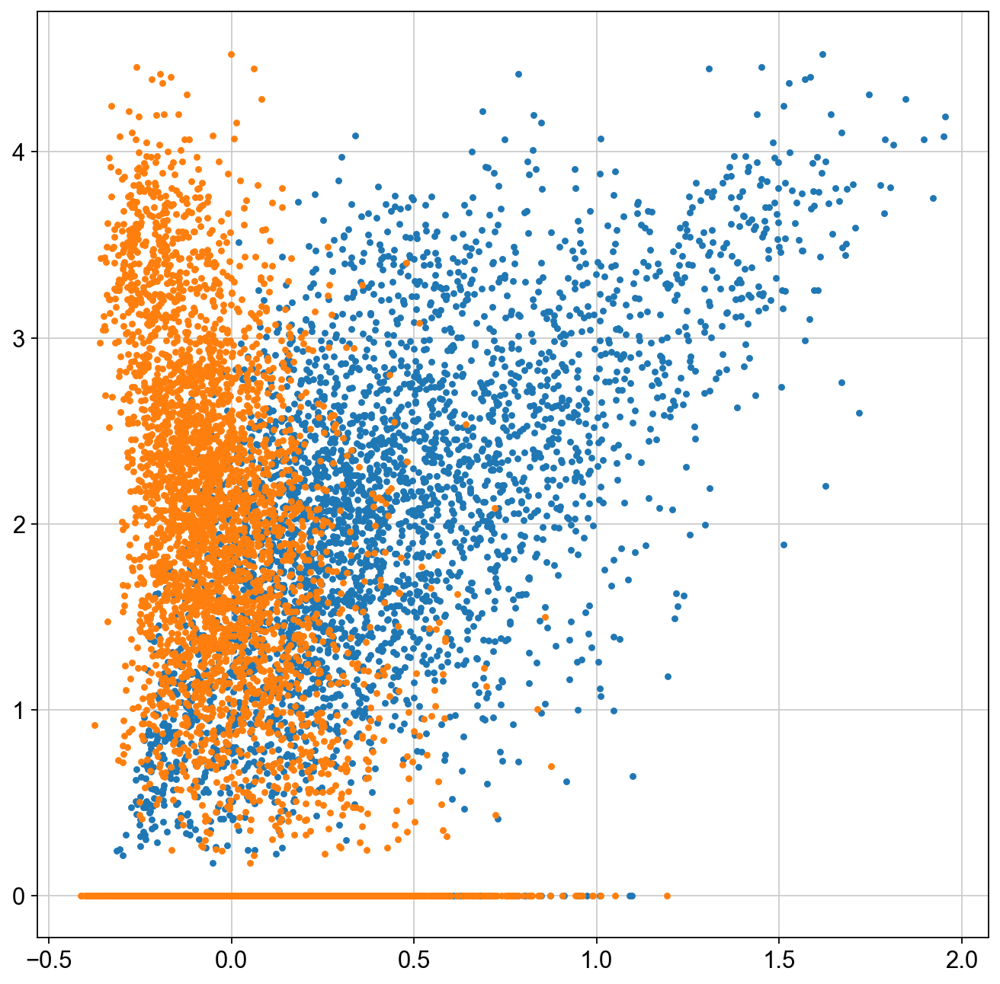

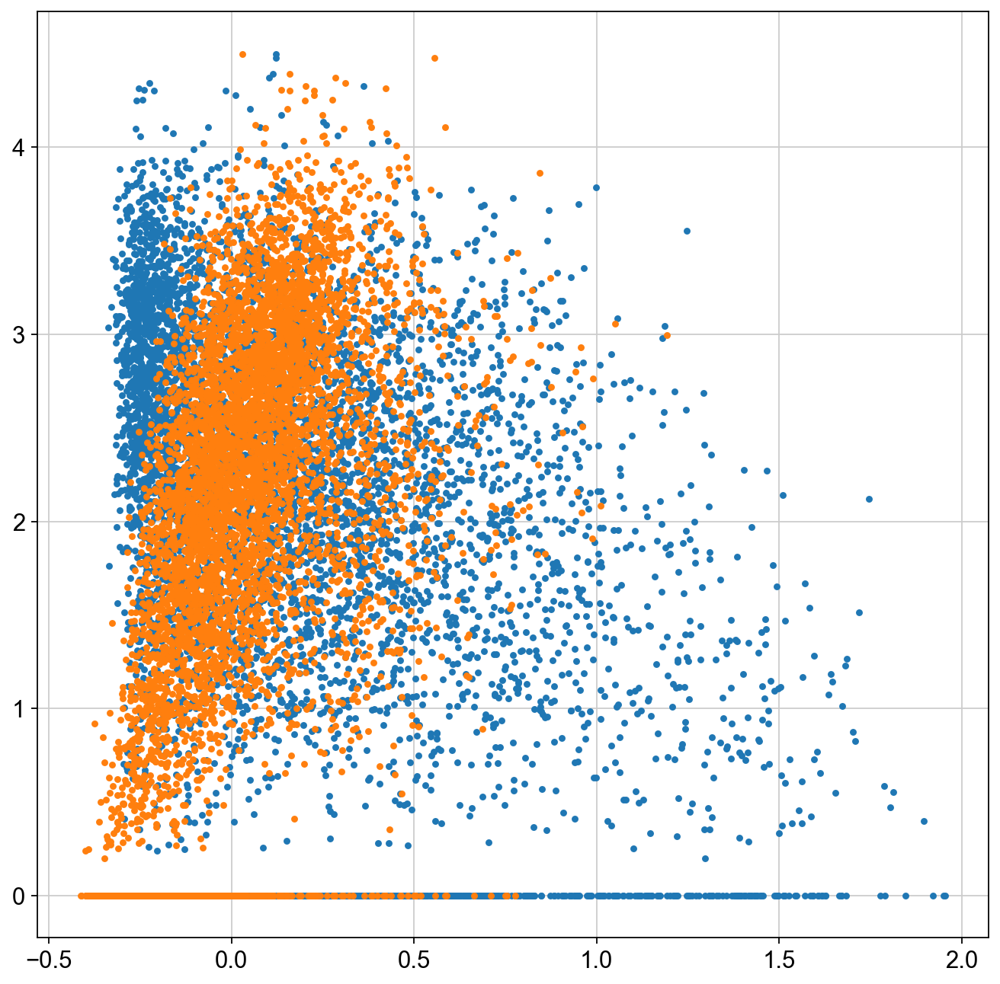

In [31]:
mship.compare_classical_basal_genes(scp1644_tumor, 'CTSE', 'KRT7')

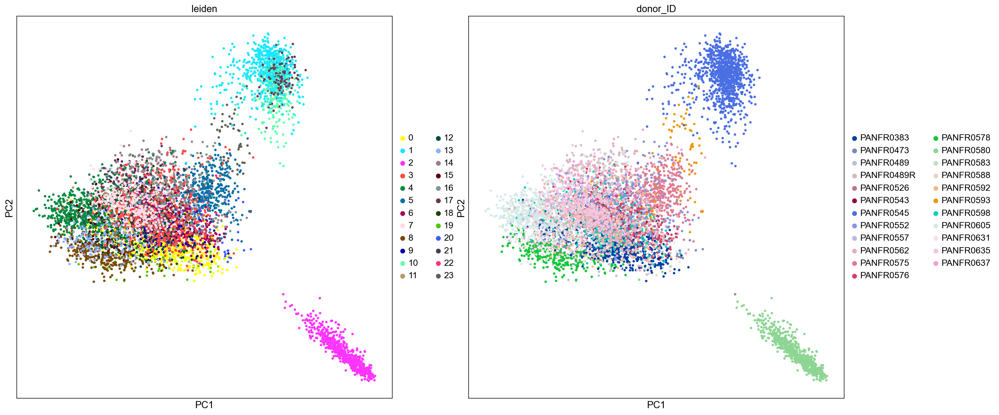

In [32]:
sc.pl.pca(scp1644_tumor, color=['leiden', 'donor_ID'], size=50)


In [33]:
scp1644_clean = scp1644_tumor.copy()[scp1644_tumor.obs.donor_ID != 'PANFR0580']

AnnData object with n_obs × n_vars = 6373 × 16604
    obs: 'biosample_id', 'donor_ID', 'Genes', 'UMI', 'dataset', 'sample.type', 'species', 'species__ontology_label', 'disease', 'disease__ontology_label', 'organ', 'organ__ontology_label', 'library_preparation_protocol', 'library_preparation_protocol__ontology_label', 'sex', 'Coarse_Cell_Annotations', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'u400genes', 'u1000counts', 'o50mtpct', 'o8000genes', 'doublet_score', 'predicted_doublet', 'leiden', 'GGB_MITOCHONDRIAL', 'classical_score', 'basal_score', 'diff_score'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'low_qual_u50cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'scrublet', 'tsne', 'umap', 'dono

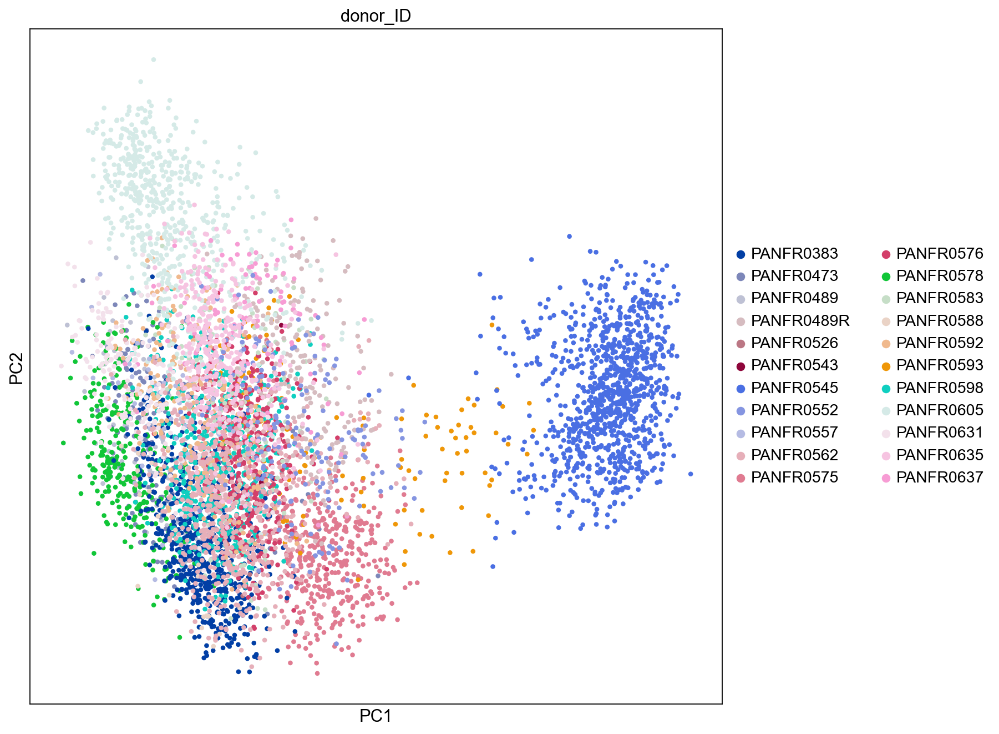

In [37]:
print(scp1644_clean)
sc.pp.pca(scp1644_clean)
sc.pl.pca(scp1644_clean, color='donor_ID', size=60)

In [60]:
print(Counter(scp1644_clean.obs.donor_ID))
print(len(Counter(scp1644_clean.obs.donor_ID)))

Counter({'PANFR0545': 1017, 'PANFR0383': 646, 'PANFR0605': 564, 'PANFR0562': 553, 'PANFR0598': 529, 'PANFR0575': 496, 'PANFR0576': 382, 'PANFR0635': 348, 'PANFR0578': 311, 'PANFR0592': 227, 'PANFR0631': 210, 'PANFR0489R': 190, 'PANFR0552': 176, 'PANFR0473': 147, 'PANFR0593': 140, 'PANFR0583': 136, 'PANFR0489': 124, 'PANFR0637': 105, 'PANFR0557': 44, 'PANFR0588': 22, 'PANFR0526': 3, 'PANFR0543': 3})
22


In [50]:
sc.pp.neighbors(scp1644_clean, n_neighbors=40, n_pcs=50)
sc.tl.leiden(scp1644_clean)
sc.tl.umap(scp1644_clean)
sc.tl.tsne(scp1644_clean)
sc.pp.highly_variable_genes(scp1644_clean, flavor="seurat")
sc.tl.rank_genes_groups(scp1644_clean, 'leiden')

In [75]:
with pd.option_context('display.min_rows', 50):
    print(pd.DataFrame(scp1644_clean.varm['PCs'][:, 0:6], index=scp1644_clean.var_names).sort_values(3))    


                  0         1         2         3         4         5
MTRNR2L1  -0.003674  0.060382  0.070292 -0.127962 -0.065424 -0.077808
SPINK1    -0.081373 -0.098730 -0.160297 -0.124620  0.014101  0.130412
CEACAM6   -0.139682  0.103317 -0.070544 -0.116502  0.172725  0.047418
PSCA      -0.052235  0.127099  0.017106 -0.110271 -0.014672 -0.058762
MMP7      -0.055096  0.081847 -0.025880 -0.087292  0.017004 -0.057520
CEACAM5   -0.089186  0.120179 -0.031010 -0.082515  0.134673  0.022559
MUC16     -0.031899  0.120597  0.105359 -0.079380 -0.035990 -0.054875
DPCR1     -0.044134  0.106571  0.004358 -0.078250  0.023146 -0.016147
TM4SF4    -0.036293  0.052854 -0.026734 -0.075509  0.028073 -0.025657
LCN2      -0.080724  0.091962  0.003835 -0.073858 -0.129669 -0.054647
IGFBP3    -0.019340  0.141998  0.067927 -0.072465 -0.087235 -0.072594
SERPINA1   0.000704  0.079575  0.000376 -0.070214 -0.005670 -0.018672
CD74       0.076196  0.089720 -0.068741 -0.066048 -0.035518 -0.073321
SYT8      -0.029988 

In [84]:
print('\n'.join(pd.DataFrame(scp1644_clean.varm['PCs'], index=scp1644_clean.var_names).sort_values(7, ascending=False).index[:50]))

KLK6
SERPINA1
MMP7
SYNE2
VCAN
S100A4
DCBLD2
STMN1
TRBC2
SULF2
ANLN
AKAP12
KLK7
MKI67
S100P
TOP2A
CENPF
KLK10
FOS
TMC5
AQP5
LYZ
BMP4
FOSB
LAMA3
FLNA
SEMA3B
KLK8
PHLDA1
ACSL5
RBP1
TPX2
TESC
PRKCDBP
PRC1
LAMC2
SLC2A1
HMGA2
RNASET2
DOCK5
ARL4C
OLFM4
LCN2
EPHB6
KLF6
PROM1
H2AFZ
VMP1
ASPM
ENC1


In [61]:
scp1644_clean_II = scp1644_tumor[[x not in ['PANFR0580', 'PANFR0588', 'PANFR0526', 'PANFR0543'] for x in scp1644_tumor.obs.donor_ID], :]

AnnData object with n_obs × n_vars = 6345 × 16604
    obs: 'biosample_id', 'donor_ID', 'Genes', 'UMI', 'dataset', 'sample.type', 'species', 'species__ontology_label', 'disease', 'disease__ontology_label', 'organ', 'organ__ontology_label', 'library_preparation_protocol', 'library_preparation_protocol__ontology_label', 'sex', 'Coarse_Cell_Annotations', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'u400genes', 'u1000counts', 'o50mtpct', 'o8000genes', 'doublet_score', 'predicted_doublet', 'leiden', 'GGB_MITOCHONDRIAL', 'classical_score', 'basal_score', 'diff_score'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'low_qual_u50cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'scrublet', 'tsne', 'umap', 'dono

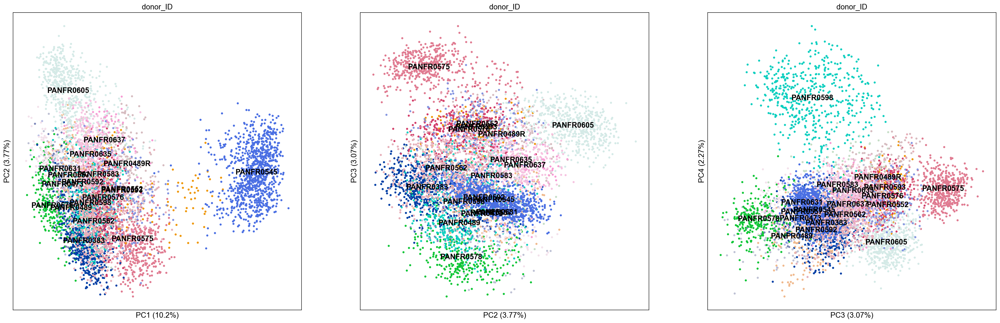

In [80]:
print(scp1644_clean_II)
sc.pp.pca(scp1644_clean_II)
sc.pl.pca(scp1644_clean_II, color='donor_ID', size=60, annotate_var_explained=True, dimensions=[(0, 1), (1, 2), (2, 3)], legend_loc="on data")


In [78]:
help(sc.pl.pca)

Help on function pca in module scanpy.plotting._tools.scatterplots:

pca(adata: anndata._core.anndata.AnnData, *, color: str | collections.abc.Sequence[str] | None = None, mask_obs: numpy.ndarray[typing.Any, numpy.dtype[numpy.bool_]] | str | None = None, gene_symbols: str | None = None, use_raw: bool | None = None, sort_order: bool = True, edges: bool = False, edges_width: float = 0.1, edges_color: str | collections.abc.Sequence[float] | collections.abc.Sequence[str] = 'grey', neighbors_key: str | None = None, arrows: bool = False, arrows_kwds: collections.abc.Mapping[str, typing.Any] | None = None, groups: str | collections.abc.Sequence[str] | None = None, components: str | collections.abc.Sequence[str] | None = None, dimensions: tuple[int, int] | collections.abc.Sequence[tuple[int, int]] | None = None, layer: str | None = None, projection: Literal['2d', '3d'] = '2d', scale_factor: float | None = None, color_map: matplotlib.colors.Colormap | str | None = None, cmap: matplotlib.colors.